# Import

In [1]:
import torch
import torchvision
from torchvision import transforms
import torch.nn as nn
import time
import copy
import torch.nn.functional as F
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, TensorDataset, DataLoader, random_split, SubsetRandomSampler
import torchvision.models as models
from torch.utils.tensorboard import SummaryWriter
import pytorch_lightning as pl
from pytorch_lightning import Trainer
import os
import re
import shutil
import sys
import ipywidgets
from scipy import stats
from os import listdir
from textwrap import wrap
import statistics
from sklearn.metrics import r2_score
#from pytorch_lightning.callbacks import ModelCheckpoint

In [2]:
AVAIL_GPUS = torch.cuda.device_count()
print(AVAIL_GPUS)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

1


In [ ]:
# Creat a file of detailed information of outputs

import csv 
# x = []
# y= []


# for idx in range(937):
#     x1, y1 = copperDataset.__getitem__(idx)
#     x.append(np.array(x1.reshape(1,len(x1))))
#     y.append(np.array(y1.reshape(1,len(y1))))
# y = np.asmatrix(np.vstack(y))
output_info = []
rows = []
Details = ['filename', 'row_index', 'col_index', 'mean', 'std', 'min', 'max', 'most frequncies']

y_mean = y.mean(axis=0)
y_std = y.std(axis=0)
y_min = y.min(axis=0)
y_max = y.max(axis=0)
output_idx = copperDataset.get_output_index(1)
bins = bins = np.arange(y.min(), y.max() + 2)
n = 5

for i in range(y.shape[1]):
    output_info.append(output_idx_raw[i][0])
    output_info.append(output_idx_raw[i][1])
    output_info.append(output_idx_raw[i][2])
    output_info.append(y_mean[0, i])
    output_info.append(y_std[0, i])
    output_info.append(y_min[0, i])
    output_info.append(y_max[0, i])
    rows.append(output_info)
    h, _  = np.histogram(y[:,i], bins, density = False)
    sorted_index_array = np.argsort(h)[::-1]
    sorted_array = h[sorted_index_array]
    rslt = sorted_array[0 : n ]
    output_info.append(rslt)
    output_info = []
    
with open('output_info.csv', 'w') as f: 
    write = csv.writer(f) 
    write.writerow(Details) 
    write.writerows(rows)

In [ ]:
# utility function for converting csv to xslx:

#Convert input .csv files (annual_growth) to .xlsx
# dir is input directory
dir = 'COPPER5_CapCost_CTax_PopGrowth_all_False/inputs'
# dir = 'COPPER5_CapCost_CTax_PopGrowth_all_false_validation/inputs'
CSV_Files = [file for file in listdir(dir) if file.endswith('.csv') and file.startswith('annual_growth')]
for i in CSV_Files:
    path = os.path.join(dir, i)
    filename = os. path. splitext(i)[0]
    info = pd.read_csv(path)
    info.to_excel ('%s/%s.xlsx' %(dir,filename), index = None, header=True)
    # os.remove(path)

In [11]:
# Remove Nan and replcae with mean
def preprocess(data, idx_list):
    tmp_data = np.asarray(data)
    tmp_idx_list = idx_list.copy()
    check = np.isnan(tmp_data).all(axis=0)
    ind =  np.where(check == True)[0]
    tmp_data = np.delete(tmp_data,ind,axis=1)
    for j in sorted(ind, reverse=True):
        del tmp_idx_list[int(j)]
        
#     Modify NaN values (missing values).
    mean_vals = np.nanmean(tmp_data, axis=0)
    inds = np.where(np.isnan(tmp_data))
    tmp_data[inds] = np.take(mean_vals, inds[1])
    return (tmp_data, tmp_idx_list)

def removeOutliers(in_data,out_data,zscore = 5):
    tmp_in_data = np.asarray(in_data)
    tmp_out_data = np.copy(out_data)
    ind = np.where(np.abs(tmp_out_data) > zscore)
    tmp_out_data = np.delete(tmp_out_data,np.unique(ind[0]),axis=0)
    tmp_in_data = np.delete(tmp_in_data,np.unique(ind[0]),axis=0)
    return(tmp_in_data,tmp_out_data)

def stdCleanup(data, idx_list, std_threshold = 1e-3):
    tmp_data = np.asarray(data)
    tmp_idx_list = idx_list.copy()
    ind = np.where(tmp_data.std(axis=0) < std_threshold)[0]
    tmp_data = np.delete(tmp_data,ind,axis=1)
    for j in sorted(ind, reverse=True):
        del tmp_idx_list[int(j)]
    return (tmp_data, tmp_idx_list)

def normalize(data):
    tmp_data = np.asarray(data)
    data_mean = tmp_data.mean(axis=0)
    data_std = tmp_data.std(axis=0)
    
    data_std[data_std < 1e-8] = 1 
    
    ind_min = np.where(tmp_data.min(axis=0) == 0)[0]
    ind_max = np.where(tmp_data.max(axis=0) == 1)[0]
    ind = np.intersect1d(ind_min,ind_max)
    data_mean[ind] = 0
    data_std[ind] = 1
    
    tmp_data = (tmp_data-data_mean)/data_std
    return tmp_data,data_mean,data_std

#plot histogram function
def plot_hist(data,data_idx,plot_name): 
    num_plot = 50
    num_col = 5
    num_row = int(np.ceil(num_plot/num_col))

    num_figures = int(np.ceil((data.shape[1])/num_plot))

    for n in range(num_figures):
        fig, axs = plt.subplots(num_row, num_col, figsize=(20, 20)) # Need to change this depending on the # of outputs. In this case, we have 10 total
        row = 0
        col = 0
        count = 0
        start_index = num_plot*n
        end_index = num_plot*(n+1)
        
        for m in range(start_index, end_index):
            if m> (data.shape[1]-1):
                break

            axs[row, col].hist(data[:,m], bins=50, histtype = 'bar')#, rwidth= 40)
            axs[row, col].grid()
            title = "\n".join(wrap(str(data_idx[m][:]), 120))
            axs[row, col].set_title("\n".join(wrap(str(data_idx[m][:]), 30)), fontsize=10)
            plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.9, 
                        wspace=0.4, 
                        hspace=1.4)
            count = count+1
            row = row + 1
            if row == num_row: # Also need to change this depending on # of outputs and desired output structure
                col = col +1
                row = 0
        for ax in axs.flat:
            ax.set(xlabel='bin', ylabel='Frequency')

        plt.savefig("%s/%d.jpg" % (plot_name,n), dpi=100)
    

# Dataset Class

In [18]:
class COPPERDataset(Dataset):

    def __init__(self, input_dir, output_dir):#, transform=None):       
        self.input_dir = input_dir
        self.output_dir = output_dir
        # create list of output folder names
        # count number of data points
        self.output_list = []
        self.run_numbers = []
        for dirname in os.listdir(self.output_dir):
            numbers = re.findall("(\d+)_outputs_", dirname)
#             numbers = re.findall("(\d+)_ct", dirname)
            if not numbers: continue
            
            self.output_list.append(dirname)
            self.run_numbers.append(numbers[0])
            dir = '/content'


        self.input_files_dict = {'Generation_type_data' : [1,'.xlsx', ['max_cap_fact',
                                                                               'min_cap_fact',
                                                                               'ramp_rate_percent', 
                                                                               'efficiency', 
                                                                               'fuel_co2', 
                                                                               'fixed_o_m', 
                                                                               'variable_o_m', 
                                                                               'fuelprice', 
                                                                               'capitalcost']],
                        'COPPER_configuration' : [1,'.xlsx',['Value']], 'annual_growth' : [1, '.xlsx', ['2030','2040','2050']]}
        self.output_files_dict = {'carbon_ap': [1,'.xlsx',['2030','2040','2050']],
                    'Total_Generation_ABA': 
                           [1,'.xlsx',['British Columbia.a',
                           'Alberta.a',
                            'Saskatchewan.a',
                            'Manitoba.a',
                            'Ontario.a',
                            'Ontario.b',
                            'Quebec.a',
                            'Quebec.b',
                            'New Brunswick.a',
                            'Newfoundland and Labrador.a',
                            'Newfoundland and Labrador.b',
                            'Nova Scotia.a',
                            'Prince Edward Island.a']],
                    'Canada_gen_outline': [1,'.xlsx',['2030','2040','2050']]}

    def __read_inputs__(self,idx):
        input_dict = {}
        input = torch.empty(0)
        run_number = self.run_numbers[idx]
        for key in self.input_files_dict.keys():
            filename = key + '_'+ str(run_number) + self.input_files_dict[key][1] 
            filename_path = os.path.join(self.input_dir, filename)
            # Maybe need adding a line to check if this file or column exist then read
            input_dict[key]= pd.read_excel(filename_path, header = 0, usecols = self.input_files_dict[key][2],engine='openpyxl')
            input = torch.cat((input,torch.from_numpy(input_dict[key].values).float().flatten()))
        filename = 'Generation_type_data' + '_'+ str(run_number) + '.xlsx'
        filename_path = os.path.join(self.input_dir, filename)
        input_dict['Is thermal?']=  pd.read_excel(filename_path, header = 0, usecols = ['Is thermal?'],engine='openpyxl').astype(int) 
        input = torch.cat((input,torch.from_numpy(input_dict['Is thermal?'].values).float().flatten()))
        return input

    def __read_outputs__(self,idx):
        output_dict = {}
        output =  torch.empty(0)
        path = os.path.join(self.output_dir, self.output_list[idx])
        for key in self.output_files_dict.keys():
            filename = key + self.output_files_dict[key][1]
            filename_path = os.path.join(path, filename)
            output_dict[key] = pd.read_excel(filename_path, header = 0, usecols = self.output_files_dict[key][2],engine='openpyxl')
            output = torch.cat((output,torch.from_numpy(output_dict[key].values).float().flatten()))

        return output

    def get_input_index(self,idx):
        input_dict = {}
        input = torch.empty(0)
        run_number = self.run_numbers[idx]
        index = []
        for key in self.input_files_dict.keys():
            filename = key + '_'+ str(run_number) + self.input_files_dict[key][1] 
            filename_path = os.path.join(self.input_dir, filename)
            # Maybe need adding a line to check if this file or column exist then read
            input_dict[key]= pd.read_excel(filename_path, header = 0, usecols = self.input_files_dict[key][2],engine='openpyxl')
            row,col = input_dict[key].shape
            row_index =  np.repeat(np.matrix(np.arange(row)).transpose(),[col],axis=1)
            col_index = np.repeat(np.matrix(np.arange(col)),[row],axis=0) 
            row_index_flatten = row_index.flatten()
            col_index_flatten = col_index.flatten()
            index=index+[[filename,row_index_flatten.item(i),col_index_flatten.item(i)] for i in range(row_index_flatten.size)]
        
        filename = 'Generation_type_data' + '_'+ str(run_number) + '.xlsx'
        filename_path = os.path.join(self.input_dir, filename)
        input_dict['Is thermal?']=  pd.read_excel(filename_path, header = 0, usecols = ['Is thermal?'],engine='openpyxl').astype(int) 
        row,col = input_dict['Is thermal?'].shape
        row_index =  np.repeat(np.matrix(np.arange(row)).transpose(),[col],axis=1)
        col_index = np.repeat(np.matrix(np.arange(col)),[row],axis=0) 
        row_index_flatten = row_index.flatten()
        col_index_flatten = col_index.flatten()
        index=index+[[filename,row_index_flatten.item(i),col_index_flatten.item(i)] for i in range(row_index_flatten.size)]
        return index
    
    def get_output_index(self,idx):
        output_dict = {}
        output =  torch.empty(0)
        index = []
        path = os.path.join(self.output_dir, self.output_list[idx])
        for key in self.output_files_dict.keys():
            filename = key + self.output_files_dict[key][1]
            filename_path = os.path.join(path, filename)
            output_dict[key] = pd.read_excel(filename_path, header = 0, usecols = self.output_files_dict[key][2],engine='openpyxl')
            output_dict_rows= pd.read_excel(filename_path, header = 0, usecols = [0],engine='openpyxl')
            output_dict_rows= output_dict_rows.values.tolist()
            headers = output_dict[key].columns
            headers = headers.tolist()
            row,col = output_dict[key].shape
            row_index =  np.repeat(np.matrix(np.arange(row)).transpose(),[col],axis=1)
            col_index = np.repeat(np.matrix(np.arange(col)),[row],axis=0) 
            row_index_flatten = row_index.flatten()
            col_index_flatten = col_index.flatten()
            index=index+[[filename,output_dict_rows[row_index_flatten.item(i)], 
                          headers[col_index_flatten.item(i)]] for i in range(row_index_flatten.size)]
    
        return index

    def __len__(self):
        # return len(self.run_numbers)
        return 1000

    def __getitem__(self, idx):
        input = self.__read_inputs__(idx)
        output = self.__read_outputs__(idx)
        return input,output

In [19]:
# Creat a dataset object

in_dir = 'COPPER5_CapCost_CTax_PopGrowth_all_False/inputs'
out_dir = 'COPPER5_CapCost_CTax_PopGrowth_all_False/outputs'
# in_dir = 'COPPER5_CapCost_CTax_PopGrowth_all_false_validation/inputs'
# out_dir = 'COPPER5_CapCost_CTax_PopGrowth_all_false_validation/outputs'
copperDataset = COPPERDataset(in_dir,out_dir)

In [20]:
input_idx_raw = copperDataset.get_input_index(0)
output_idx_raw = copperDataset.get_output_index(0)
for i in range(len(output_idx_raw)):
    output_idx_raw[i].append(i)
    
for i in range(len(input_idx_raw)):
    input_idx_raw[i].append(i)

1000


In [21]:
#Read all data on memory

x = []
y = []

for idx in range(1000):
    x1, y1 = copperDataset.__getitem__(idx)
    x.append(np.array(x1.reshape(1,len(x1))))
    y.append(np.array(y1.reshape(1,len(y1))))

x_raw = np.array(np.vstack(x))
y_raw = np.array(np.vstack(y))

In [22]:
# Remove Nan
x_p, input_p_idx = preprocess(x_raw, input_idx_raw)
y_p, output_p_idx = preprocess(y_raw, output_idx_raw)

In [23]:
# Normalization and Remove Outliers 

x_s, input_s_idx  = stdCleanup(x_p, input_p_idx)
y_s, output_s_idx = stdCleanup(y_p, output_p_idx)

x,mean_x,std_x = normalize(x_s)
y,mean_y,std_y = normalize(y_s)

# print(y_s.std(axis=0))

In [ ]:
# Plot input and output distribution in dataset
print(x.shape)
print(y.shape)
plot_hist(x,input_s_idx,'input_hist_norm')
plot_hist(y,output_s_idx,'output_hist_norm')

In [24]:
ignore_index = [51,54,60,65,68,86,87,91,94,112,118,119,134,168,171,182,185,203,204,208,211,229,235,236,285,295,299,325,327,328,347,349,351,352,353,354,368,384,385,386,393,394,395,407]
# ignore_index = []
tmp_index = [tmp_list[3] for tmp_list in output_s_idx]
indices = np.where(np.in1d(tmp_index,ignore_index))[0]
y_train_np = np.delete(y,indices,axis=1)
y_train_idx = output_s_idx.copy()
for i in sorted(indices, reverse=True):
    del y_train_idx[i]

x_train_np = x
x_train_idx = input_s_idx.copy()
mean_y_np = np.delete(mean_y,indices)
std_y_np = np.delete(std_y,indices)

In [16]:
print(x_train_idx)

NameError: name 'x_train_idx' is not defined

In [ ]:
print(y_train_idx)

In [ ]:
print(len(x_train_idx))

In [ ]:
# Write mean and std of data in a file 

df = pd.DataFrame(mean_x, columns = ['mean_x'])
df = pd.concat([df, pd.DataFrame(std_x, columns = ['std_x'])], axis = 1)
df = pd.concat([df, pd.DataFrame(mean_y_np, columns = ['mean_y'])], axis = 1)
df = pd.concat([df, pd.DataFrame(std_y_np, columns = ['std_y'])], axis = 1)
df.to_excel('Mean_std.xlsx',index=False)

In [25]:
x_train = torch.tensor(x_train_np)
y_train = torch.tensor(y_train_np)

print(x_train.shape)
print(y_train.shape)

torch.Size([1000, 39])
torch.Size([1000, 57])


##### Initialize 

In [26]:
dim_input,dim_output = x_train.shape[1],y_train.shape[1]
print(dim_input)
print(dim_output)
num_epoch = 100
batch_size = 128
lr = 1e-3

39
57


In [27]:
# Split dataset to train, validation, and test sets

test_ratio = 0.05
valid_ratio = 0.1
X_polt = x_train
Y_polt = y_train

x_train, x_test, y_train, y_test = train_test_split(x_train, y_train, test_size=test_ratio, random_state=1, shuffle=True)
x_train, x_valid, y_train, y_valid = train_test_split(x_train, y_train, test_size=valid_ratio, random_state=1, shuffle=True)
train_dataset = TensorDataset(x_train,y_train)
valid_dataset = TensorDataset(x_valid,y_valid)
test_dataset = TensorDataset(x_test,y_test)

# Model

In [2]:
class block_1d(pl.LightningModule):
    def __init__(self,in_dim,out_dim,activation=nn.ReLU,dropout = 0.5):
#         self.learning_rate = lr
        super(block_1d, self).__init__()
        self.block = nn.Sequential(
            #nn.BatchNorm1d(in_dim),
#             nn.Dropout(dropout),
            nn.Linear(in_dim,out_dim, bias=True),
#             nn.Linear(in_dim,out_dim),
            activation(),
        )

    def forward(self, x):
        out = self.block(x)
        return out
###############################################################################
class res_block_1d(pl.LightningModule):
    def __init__(self, in_dim, out_dim, activation=nn.ReLU,dropout = 0.5):
        super(res_block_1d, self).__init__()
        self.activation = activation()
        self.block = nn.Sequential(
            nn.BatchNorm1d(in_dim),
            nn.Dropout(dropout),
            nn.Linear(in_dim, out_dim, bias=True),
            activation(),
            nn.BatchNorm1d(out_dim),
            nn.Dropout(dropout),
            nn.Linear(out_dim, out_dim, bias=True),
            activation(),
        )

    def forward(self, x):
#         out = self.activation(self.block(x) + x)
        out = self.block(x) + x
        return out
################################################################################  
class resnet(pl.LightningModule):
    def __init__(self, in_dim, out_dim, layers):
        #layers: list of layer_spec
        #layer_spec: list of [block_type, block dimenssion, block activation, dropout]
        super(resnet, self).__init__()
        self.loss = nn.MSELoss()
        self.num_layers = len(layers)+1
        for index in range(self.num_layers):
            if index == 0 :
                setattr(self, "layer_" + str(index), layers[index][0](in_dim, layers[index][1], layers[index][2],layers[index][3]))
            elif index == self.num_layers-1:
                setattr(self, "layer_" + str(index), nn.Linear(layers[index-1][1], out_dim))
            else:
                setattr(self, "layer_" + str(index), layers[index][0](layers[index-1][1], layers[index][1],layers[index][2],layers[index][3]))
    
    def forward(self, x):
        for index in range(self.num_layers):
            x = getattr(self, "layer_" + str(index))(x)
        return x
###################################################################################    
    def train_dataloader(self):
        train_loader = torch.utils.data.DataLoader(dataset = train_dataset,
                                                   batch_size=batch_size,
                                                   #sampler=train_sampler,
                                                   drop_last = False,
                                                   shuffle=True,
                                                   num_workers=1,
                                                   pin_memory = True)
        return train_loader

    def val_dataloader(self):
        validation_loader = torch.utils.data.DataLoader(dataset = valid_dataset,
                                                        batch_size=batch_size,
                                                        #sampler=valid_sampler,
                                                        drop_last = False,
                                                        shuffle=True,
                                                        num_workers=1,
                                                        pin_memory = True)
        return validation_loader

    def test_dataloader(self):
        test_loader = torch.utils.data.DataLoader(dataset = test_dataset,
                                                  batch_size=batch_size,
                                                  #sampler=test_sampler,
                                                  drop_last = False, 
                                                  shuffle=False,
                                                  num_workers=1,
                                                  pin_memory = False)
        return test_loader   
#################################################################################    
    def training_step(self, batch, batch_idx):
        data, target = batch
        preds = self(data)
        loss = self.loss(preds, target)
        self.log('train_loss_step', loss)#,prog_bar=True)
        return {'loss': loss}

    def training_step_end(self, outputs):
        return outputs
    
    def training_epoch_end(self, outputs) -> None:
        self.log('train_loss_epoch',torch.stack([x['loss'] for x in outputs]).mean())
        
    ########################################################    
        
    def validation_step(self, batch, batch_idx):
        data, target = batch
        preds = self(data)
        loss = self.loss(preds, target)
        self.log('val_loss_step', loss)#, prog_bar=True)
        return {'val_loss':loss}
    

    def validation_step_end(self, outputs):
        return outputs

    def validation_epoch_end(self,outputs)->None:
        self.log('val_loss_epoch',torch.stack([x['val_loss'] for x in outputs]).mean())
        
    ########################################################
  
    def test_step(self, batch, batch_idx):
        data, target = batch
        preds = self(data)
        loss = self.loss(preds, target)
        self.log("test_loss", loss)#, prog_bar=True)
        return {'test_loss':loss}

    def test_epoch_end(self,outputs)->None:
        torch.stack([x['test_loss'] for x in outputs]).mean()

    ########################################################

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr= 1e-3)
        return optimizer

In [ ]:
# Train Model

from pytorch_lightning.callbacks.gpu_stats_monitor import GPUStatsMonitor     
# if __name__ == '__main__':
log_path = 'COPPER_runs/COPPER938/'
gpuStatnMonitor = GPUStatsMonitor()

layers = [[block_1d,128,nn.ReLU,0]]
#     layers = []
num_blocks = 8

for i in range(num_blocks):
    layers.append([res_block_1d,128,nn.ReLU,0.2])  
#         layers.append([block_1d,512,nn.ReLU,0.5])  

logger = pl.loggers.TensorBoardLogger(
    log_path,
    name = 'COPPER938_%s epoch_%sblocks _%s nodes _%s dropout' % 
    (num_epoch,  num_blocks, layers[1][1], layers[1][3])
)

trainer = pl.Trainer(gpus=1,
                     accelerator='ddp',
                     max_epochs=num_epoch,
                     logger=logger,
                     profiler="simple",
                     callbacks = [gpuStatnMonitor],
                     progress_bar_refresh_rate=20,
                     auto_lr_find = True
                 )


model = resnet(dim_input,dim_output,layers)

trainer.fit(model)
# Save model
trainer.save_checkpoint("Model_Jan9.ckpt")
results = trainer.test()

In [3]:
# Load saved model 
layers = [[block_1d,128,nn.ReLU,0]]
dim_output = 57
dim_input = 39
num_blocks = 8

for i in range(num_blocks):
    layers.append([res_block_1d,128,nn.ReLU,0.2])  
 
new_model = resnet.load_from_checkpoint("Model_Jan8.ckpt", in_dim = dim_input, out_dim = dim_output, layers = layers )

In [ ]:
# %%time

y = new_model (x_train)
print(y[0])
print(y_train[0])

In [ ]:
main_outputs = [0, 9, 10, 11, 15, 17, 20 ,21, 22, 24, 31, 32, 33, 37, 40, 41, 42, 45, 47, 50, 54, 56]
for i in main_outputs:
    y_t = y_train(:)

In [ ]:
# Plot Regression

r2_list1 = []
model.eval()
test_input, test_output = X_polt, Y_polt
# test_input, test_output = next(iter(model.test_dataloader()))
predictions = (model (test_input.to(device)).detach()).cpu()
# random_selection_outputs = torch.randint(0, dim_output, (60,))


num_plot = 35
num_col = 3
num_row = int(np.ceil(num_plot/num_col))

num_figures = int(np.ceil(dim_output/num_plot))

for n in range(num_figures):
    fig, axs = plt.subplots(num_row, num_col, figsize=(15,28)) # Need to change this depending on the # of outputs. In this case, we have 10 total
    count = 0
    row = 0
    col = 0
# for i in random_selection_outputs:
    for i in range(n*num_plot, (n+1)*num_plot):
        if i> (dim_output-1):
            break
        r2 = r2_score(test_output[:,i], predictions[:,i])
        r2_list1.append(r2)
        x, y = [-10, 10],[-10, 10]
        axs[row, col].scatter(test_output[:,i], predictions[:,i])
        axs[row, col].plot(x, y, c='red') # Perfect prediction line
        axs[row, col].set_title("\n".join(wrap(str(y_train_idx[i]), 30)), fontsize=10)
        plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.9, 
                        wspace=0.4, 
                        hspace= 1)
        count = count+1
        row = row + 1
        if row ==num_row: # Also need to change this depending on # of outputs and desired output structure
            col = col +1
            row = 0

    for ax in axs.flat:
        ax.set(xlabel='Actual', ylabel='Predicted')
    
    plt.savefig("regression_%d.jpg" %(n), dpi=200)

In [ ]:
# mean and std of r2 by trained model
mean_r2_1 = sum(r2_list1) / len(r2_list1)
std_r2_1 = statistics.pstdev(r2_list1)
print(mean_r2_1)
print(std_r2_1)

In [ ]:
# Prediction with saved model
new_model.eval()
with torch.no_grad():
    predictions = new_model (x_test)

In [ ]:
# Plot Regression
# test_input, test_output = X_polt, Y_polt
test_input, test_output = x_test, y_test
# test_input, test_output = next(iter(model.test_dataloader()))
# predictions = (model (test_input.to(device)).detach()).cpu()
# random_selection_outputs = torch.randint(0, dim_output, (60,))

r2_list = []

num_plot = 35
num_col = 3
num_row = int(np.ceil(num_plot/num_col))

num_figures = int(np.ceil(dim_output/num_plot))

for n in range(num_figures):
    fig, axs = plt.subplots(num_row, num_col, figsize=(15,28)) # Need to change this depending on the # of outputs. In this case, we have 10 total
    count = 0
    row = 0
    col = 0
# for i in random_selection_outputs:
    for i in range(n*num_plot, (n+1)*num_plot):
        if i> (dim_output-1):
            break
        r2 = r2_score(test_output[:,i], predictions[:,i])
        r2_list.append(r2)
        x, y = [-10, 10],[-10, 10]
        axs[row, col].scatter(test_output[:,i], predictions[:,i])
        axs[row, col].plot(x, y, c='red') # Perfect prediction line
        axs[row, col].set_title("\n".join(wrap(str(y_train_idx[i]), 30)), fontsize=10)
        plt.subplots_adjust(left=0.1,
                        bottom=0.1, 
                        right=0.9, 
                        top=0.9, 
                        wspace=0.4, 
                        hspace= 1)
        count = count+1
        row = row + 1
        if row ==num_row: # Also need to change this depending on # of outputs and desired output structure
            col = col +1
            row = 0

    for ax in axs.flat:
        ax.set(xlabel='Actual', ylabel='Predicted')
    
    plt.savefig("regression_%d.jpg" %(n), dpi=200)

In [ ]:
# mean and std of r2 by saved model
mean_r2 = sum(r2_list) / len(r2_list)
std_r2 = statistics.pstdev(r2_list)
print(mean_r2)
print(std_r2)

In [ ]:
print(x_train_idx[10])

In [ ]:
# Plot outputs vs inputs

main_outputs = [0, 9, 10, 11, 15, 17, 20 ,21, 22, 24, 31, 32, 33, 37, 40, 41, 42, 45, 47, 50, 54, 56]
gen_plot = True
num_col = len(main_outputs)
num_row = x_train.shape[1]


# num_figures = int(np.ceil(y_train.shape[1]/num_col))

num_figures = 1
for n in range(num_figures):
    f = plt.figure()   
    f,axs = plt.subplots(num_row, num_col, figsize=(30,70))

    for i in range(num_col*n,  x_train.shape[1]):
        for j in range(num_col*n, num_col):
            if gen_plot == True:
                x, y = [-10, 10],[-10, 10]
                axs[i][j].scatter(x_train[:,i], y_train[:,main_outputs[j]])
                axs[i][j].set(xlabel= j, ylabel= i)


    plt.savefig("inputs_outputs_%d.jpg" %(n), dpi=200)

<Figure size 432x288 with 0 Axes>

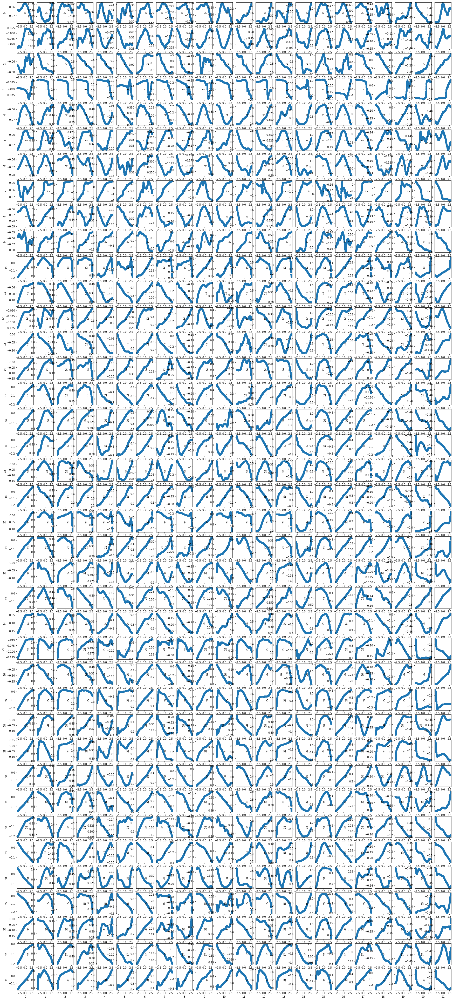

In [10]:
# Predictions with the model by randomly changing each inputs (1000 sample of each) and plot output vs each input
dim_input = 39
torch.manual_seed(0)
new_model.eval()
rand_list = np.random.uniform(-3, 3, 1000)
z1 = torch.FloatTensor(rand_list)
main_outputs = [0, 9, 10, 11, 15, 17, 20 ,21, 22, 24, 31, 32, 33, 37, 40, 41, 42, 45, 47, 50, 54, 56]
num_col = len(main_outputs)
num_row = dim_input
f = plt.figure()   
f,axsi = plt.subplots(num_row, num_col, figsize=(30,70))

for i in range(dim_input):
    x_train_new = torch.zeros(1000,dim_input)
    x_train_new[:,i] = z1
    with torch.no_grad():
        y_new = new_model (x_train_new)

    for j in range(num_col):
        axsi[i][j].scatter(x_train_new[:,i], y_new[:,main_outputs[j]])
        axsi[i][j].set(xlabel= j, ylabel= i)
        
plt.savefig("inputs_vs_outputs.jpg" , dpi=200)

<Figure size 432x288 with 0 Axes>

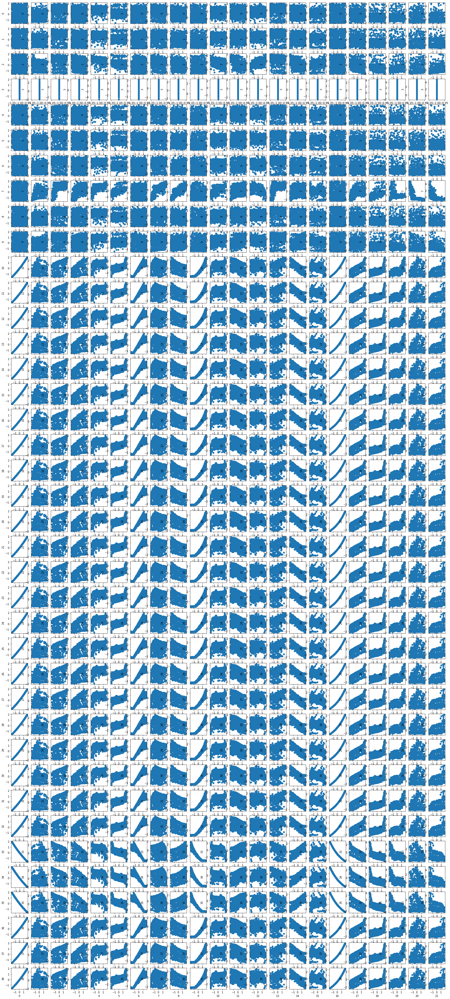

In [28]:
# Predictions with the model by randomly changing ALL inputs (1000 sample of each) and plot output vs each input
dim_input = 39
torch.manual_seed(0)
new_model.eval()
rand_list = np.random.uniform(-3, 3, (1000, 39))
x_train_new = torch.FloatTensor(rand_list)
main_outputs = [0, 9, 10, 11, 15, 17, 20 ,21, 22, 24, 31, 32, 33, 37, 40, 41, 42, 45, 47, 50, 54, 56]
num_col = len(main_outputs)
num_row = dim_input
f = plt.figure()   
f,axsi = plt.subplots(num_row, num_col, figsize=(30,70))

for i in range(dim_input):
#     x_train_new = torch.zeros(1000,dim_input)
#     x_train_new[:,i] = z1
    with torch.no_grad():
        y_new = new_model (x_train)

    for j in range(num_col):
        x, y = [-10, 10],[-10, 10]
        axsi[i][j].scatter(x_train[:,i], y_new[:,main_outputs[j]])
        axsi[i][j].set(xlabel= j, ylabel= i)
        
plt.savefig("inputs_vs_outputs_change_all.jpg" , dpi=200)

/home/zahraj/jupyter1/lib/python3.6/site-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/home/zahraj/jupyter1/lib/python3.6/site-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/home/zahraj/jupyter1/lib/python3.6/site-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlie

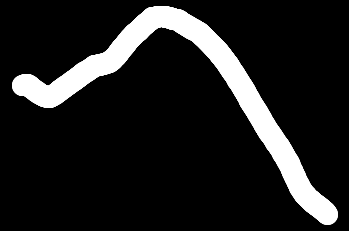

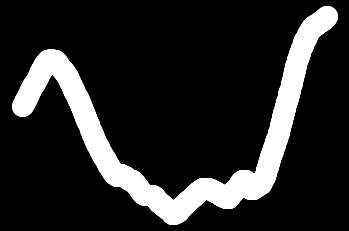

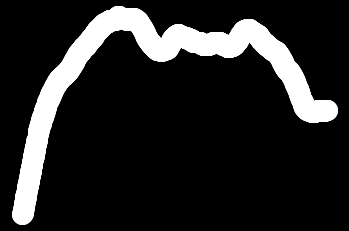

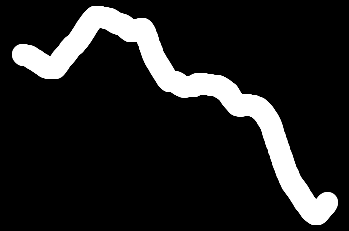

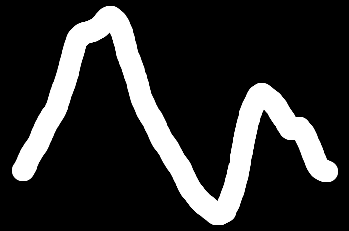

...

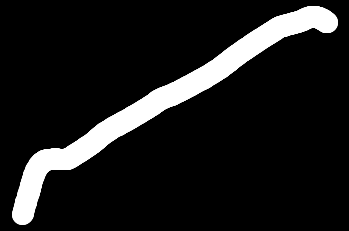

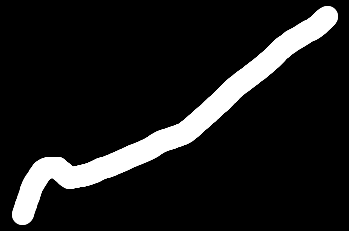

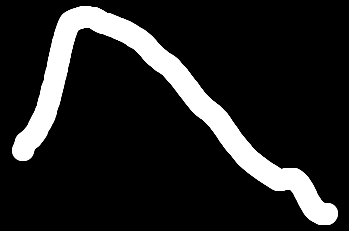

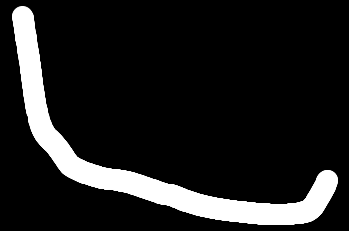

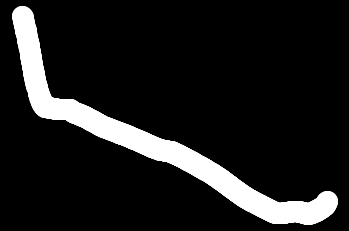

In [4]:
# Predictions with the model by randomly changing each inputs (1000 sample of each) and plot output vs each input save as img
dim_input = 39
torch.manual_seed(0)
new_model.eval()
rand_list = np.random.uniform(-3, 3, 2000)
z1 = torch.FloatTensor(rand_list)
main_outputs = [0, 9, 10, 11, 15, 17, 20 ,21, 22, 24, 31, 32, 33, 37, 40, 41, 42, 45, 47, 50, 54, 56]
num_col = len(main_outputs)
num_row = dim_input


for i in range(dim_input):
    x_train_new = torch.zeros(2000,dim_input)
    x_train_new[:,i] = z1
    with torch.no_grad():
        y_new = new_model (x_train_new)

    for j in range(num_col):
        fig = plt.figure()
        fig.patch.set_facecolor("black")
        fig.canvas.draw()
        plt.tick_params(left=False, labelleft=False) #remove ticks
        plt.box(False)
        ax = plt.axes()

#         ax.set(facecolor = 'black')
        plt.plot(x_train_new[:,i], y_new[:,main_outputs[j]], 'bo', markersize = 20, color = 'white')
        plt.axis('off')
#         fig.canvas.draw()
#         fig.set_size_inches(28, 28)
        plt.savefig("plots_img/%d_%d.png" %(j,i), dpi = 200, facecolor = fig.patch.get_facecolor(), edgecolor = 'none')
#         if j ==1:
#             break

In [2]:
## Image plots
#Load, resize, change from RGB to binary(black and white) save as np.array the same asn MNIST
import cv2
import glob
X_data = []
files = glob.glob("plots_img/*.png")
IMG_SIZE = 28

for img in files:
    image = cv2.imread(img, 2)
    image = cv2.resize(image, (IMG_SIZE, IMG_SIZE))
    ret, bw_img = cv2.threshold(image,127,255,cv2.THRESH_BINARY)
    X_data.append (bw_img)

X_data = np.array(X_data)
X_data = X_data.astype('float32') / 255


In [3]:
# Dimensionality reduction, TSNe 
from sklearn.manifold import TSNE

x = X_data.reshape(len(X_data),-1)
tsne = TSNE(n_components=2, verbose=1, random_state=123).fit_transform(x)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 858 samples in 0.001s...
[t-SNE] Computed neighbors for 858 samples in 0.119s...
[t-SNE] Computed conditional probabilities for sample 858 / 858
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 55.759991
[t-SNE] KL divergence after 1000 iterations: 0.975794


In [4]:
tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

In [27]:
# cluster TSNe plots, Kmeans
from sklearn.cluster import KMeans
# from keras.applications.vgg16 import preprocess_input 

tsne1 = tsne.reshape(len(tsne),-1)
# x = preprocess_input(X_data)
kmeans = KMeans(n_clusters= 10 ,n_jobs=-1, random_state=22)
kmeans.fit(tsne1)
kmeans.labels_

/home/zahraj/jupyter1/lib/python3.6/site-packages/sklearn/cluster/_kmeans.py:793: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  " removed in 1.0 (renaming of 0.25).", FutureWarning)


array([8, 7, 1, 7, 6, 3, 6, 1, 4, 2, 1, 8, 5, 1, 0, 2, 9, 3, 4, 5, 3, 2,
       5, 1, 7, 0, 1, 0, 8, 4, 5, 2, 6, 9, 8, 3, 2, 3, 6, 9, 6, 1, 2, 8,
       6, 3, 6, 0, 1, 0, 6, 5, 7, 4, 1, 0, 6, 6, 9, 7, 8, 9, 8, 2, 9, 8,
       0, 1, 3, 9, 0, 1, 6, 0, 5, 0, 5, 2, 1, 2, 4, 5, 2, 5, 2, 2, 4, 4,
       1, 3, 3, 4, 3, 6, 0, 6, 2, 4, 7, 4, 7, 9, 9, 6, 4, 4, 3, 3, 7, 4,
       4, 9, 4, 4, 3, 4, 2, 1, 6, 4, 7, 5, 0, 7, 8, 8, 6, 7, 0, 5, 3, 3,
       6, 0, 8, 4, 2, 0, 1, 8, 7, 1, 0, 4, 3, 0, 2, 7, 8, 7, 7, 5, 8, 9,
       7, 8, 8, 2, 2, 8, 9, 2, 3, 0, 2, 4, 2, 6, 4, 8, 2, 6, 7, 4, 7, 6,
       8, 0, 8, 3, 8, 0, 4, 0, 8, 2, 8, 3, 8, 6, 4, 4, 6, 3, 4, 6, 0, 8,
       1, 4, 1, 6, 8, 9, 4, 5, 6, 1, 4, 2, 0, 3, 2, 4, 8, 4, 8, 8, 5, 4,
       2, 6, 4, 2, 8, 1, 6, 7, 7, 7, 3, 1, 2, 2, 4, 8, 7, 2, 2, 0, 8, 3,
       3, 0, 3, 2, 9, 8, 3, 8, 1, 4, 8, 9, 1, 0, 2, 7, 3, 2, 6, 4, 2, 3,
       2, 8, 8, 6, 3, 3, 0, 4, 2, 1, 8, 1, 3, 7, 7, 9, 9, 7, 1, 3, 4, 8,
       1, 4, 3, 1, 3, 6, 6, 8, 4, 7, 4, 8, 8, 1, 7,

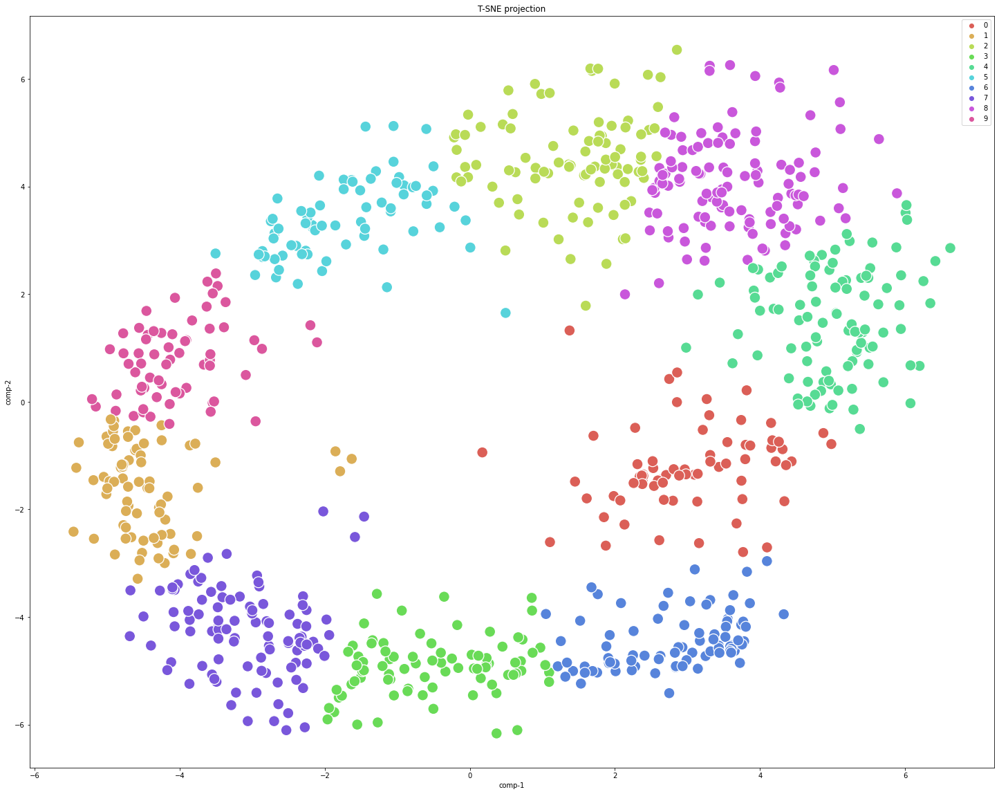

In [29]:
# Plot clusters, TSNe then Kmeans, kmeans.labels_ from: # cluster TSNe plots, Kmeans
import seaborn as sns

df = pd.DataFrame()
df["y"] = kmeans.labels_
df["comp-1"] = tsne[:,0]
df["comp-2"] = tsne[:,1]

plt.figure(figsize=(25,20))
sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 10),
                data=df, s = 250).set(title="T-SNE projection")
plt.savefig("clusters, TSNe then Kmeans.png")

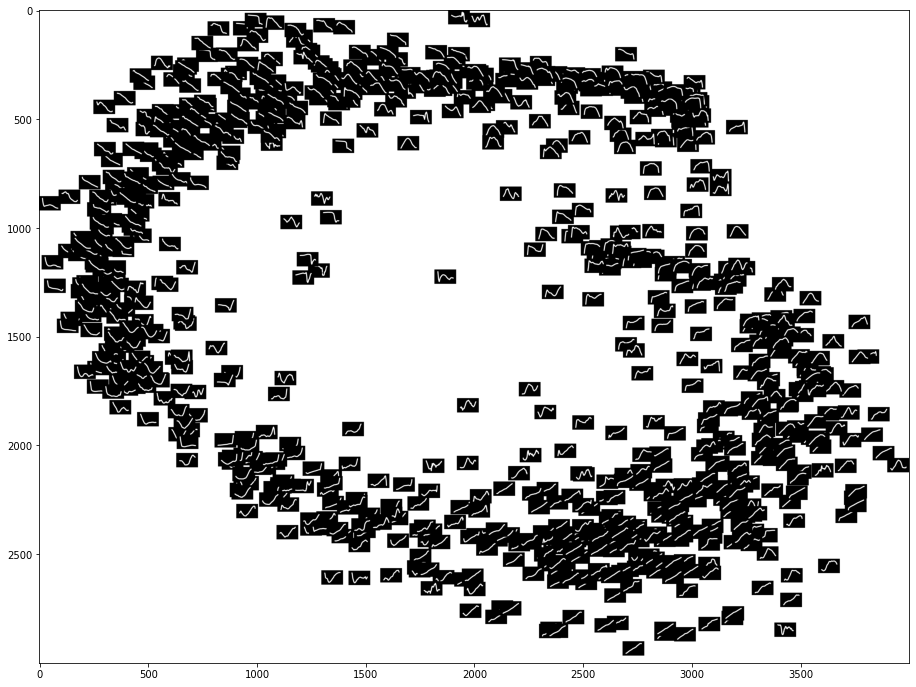

In [15]:
# Plots in TSNe

from PIL import Image

width = 4000
height = 3000
max_dim = 100

full_image = Image.new('RGBA', (width, height))
for img, x, y in zip(files, tx, ty):
    tile = Image.open(img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

plt.figure(figsize = (16,12))
plt.savefig("Plots_in_TSNe.png")
plt.imshow(full_image)

In [8]:
# cluster plots, Kmeans
from sklearn.cluster import KMeans
 
# Reshape arrayes(from images) to 1D to be compatible with Kmeans

x = X_data.reshape(len(X_data),-1)

kmeans = KMeans(n_clusters= 20 ,n_jobs=-1, random_state=22)
kmeans.fit(x)
kmeans.labels_

/home/zahraj/jupyter1/lib/python3.6/site-packages/sklearn/cluster/_kmeans.py:793: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 1.0 (renaming of 0.25).
  " removed in 1.0 (renaming of 0.25).", FutureWarning)


array([11,  5,  1, 17,  4,  4, 18, 14, 16,  3,  1,  3, 19, 14, 15,  3,  8,
        4,  2, 19,  5, 19, 19,  8,  4,  6,  1,  4, 11,  2,  7, 11,  0, 12,
       11,  5, 10,  0, 18, 14, 15,  1, 10, 11,  0,  4, 18,  6,  1,  6, 15,
        7, 17,  2, 14,  6,  0, 12,  8,  4, 11, 12, 11, 19,  8, 16,  6,  8,
        0, 12,  6,  1,  0,  6,  7,  6,  7, 10,  1, 10, 13,  7, 10,  3, 19,
       10, 13, 16,  8,  5,  0, 11, 17, 18,  6,  4, 10,  2,  5, 13,  5,  8,
       12,  4, 13, 13,  4,  4,  4, 13,  2,  8, 13, 11,  4, 13, 10,  1,  0,
        2, 17,  9, 18, 15, 11, 11,  0, 17,  6,  3, 12,  4,  0,  6, 11, 13,
        3,  6, 14,  2, 15,  1,  6,  2,  4,  6, 10, 17,  2,  5, 17,  7, 11,
        8,  5,  3, 16, 19, 10, 11, 14, 10,  0,  6, 10,  2, 19, 18,  2, 11,
       10, 18, 15,  2, 17, 18,  2,  6, 11,  4,  2,  6,  6,  6, 11,  3, 11,
       17,  6,  0, 13, 13,  0,  0, 16, 18,  4,  2,  1, 13,  1, 18, 11, 12,
       13,  7,  0,  1, 13, 10,  6,  5,  3,  2, 10,  6, 16, 11,  7, 13, 19,
       18, 13, 10, 11, 14

In [13]:
# Group actual image filename and cluster names for each plot
groups = {}
for file, cluster in zip(files,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

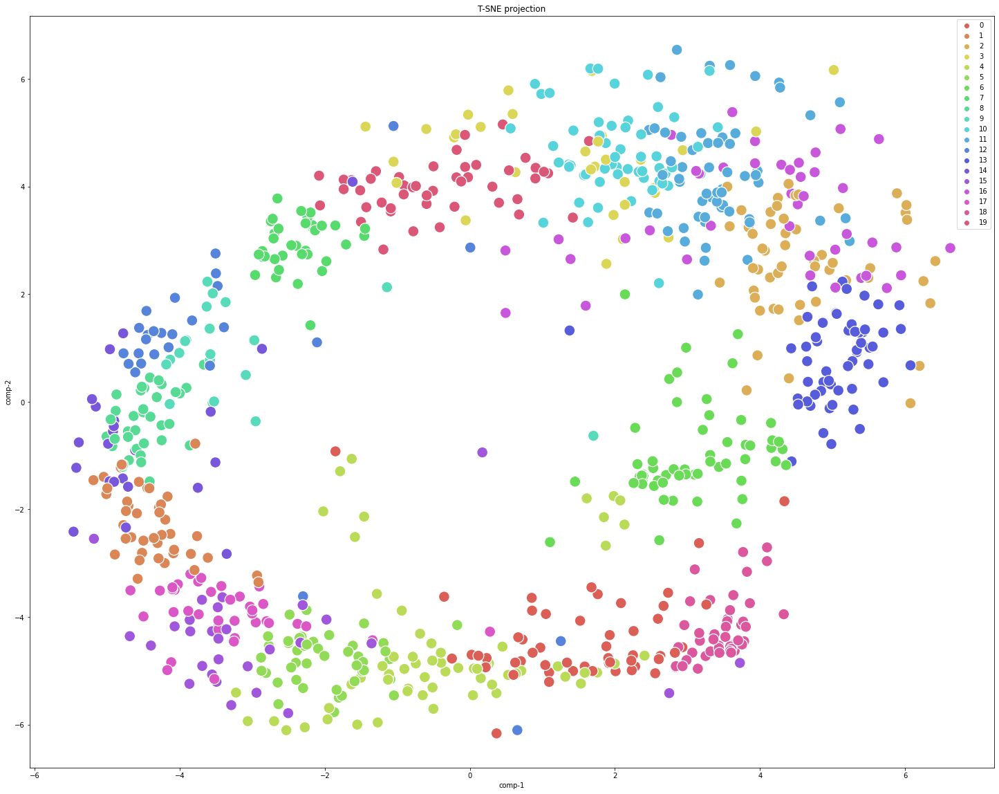

In [10]:
# Kmenas then TSNe, kmeans.labels_ from: cluster plots, Kmeans

df = pd.DataFrame()
df["y"] = kmeans.labels_
df["comp-1"] = tsne[:,0]
df["comp-2"] = tsne[:,1]

plt.figure(figsize=(25,20))
sns.scatterplot(x="comp-1", y="comp-2", hue=df.y.tolist(),
                palette=sns.color_palette("hls", 20),
                data=df, s = 250).set(title="T-SNE projection")
plt.savefig("Kmenas_then_TSNe.png")

In [14]:
print(X_data.shape)

(858, 28, 28)


In [15]:
print(len(groups[1]))

109


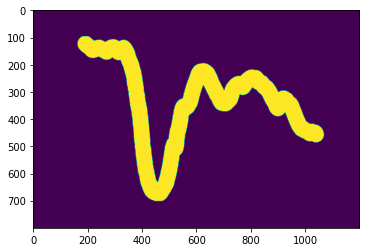

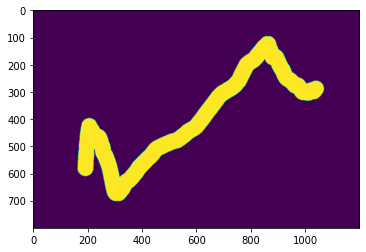

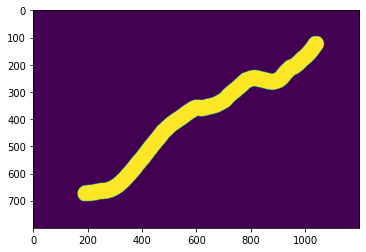

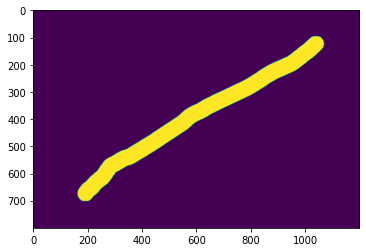

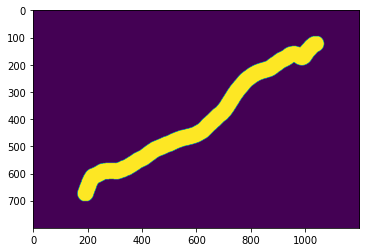

...

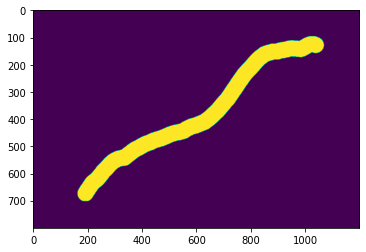

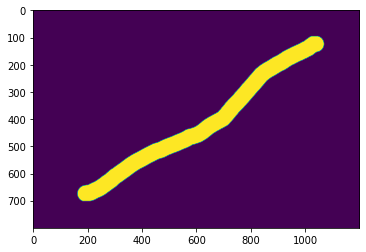

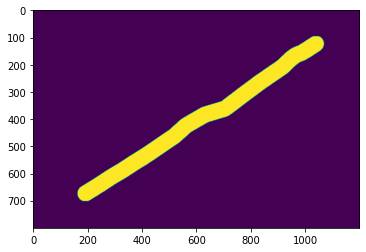

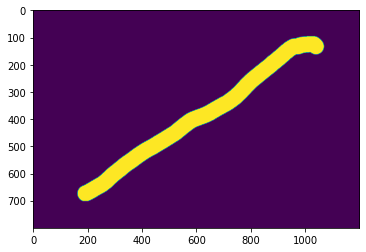

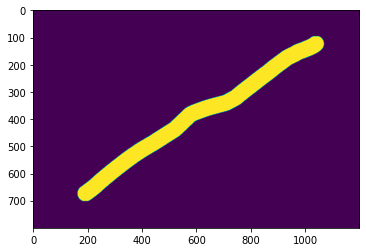

In [26]:
# Visualize each cluster images
for i in groups[18]:
    ax = cv2.imread(i, 2)
    imgplot = plt.imshow(ax)
    plt.show()

In [ ]:
# Plot outputs correlations and get r2

r2_dict = {}
r2_list =[]
gen_plot = True
# num_plot = 40
num_col = 20
num_row = y_train.shape[1]


num_figures = int(np.ceil(y_train.shape[1]/num_col))


for n in range(num_figures):
    num_row = y_train.shape[1]-n*num_col
    f = plt.figure()   
    f,axs1 = plt.subplots(num_row, num_col, figsize=(30,70))
    

    for i in range(num_col*n,  y_train.shape[1]):
        r2_list = []
        for j in range(num_col*n, min(num_col*(n+1), y_train.shape[1])):
            if j > i :
                break
            r2 = r2_score(y_train[:,i], y_train[:,j])
            if r2 > 0.8:
                r2_list.append(j)  
                r2_dict[i] = r2_list
            if gen_plot == True:
                axs1[i-n*num_col][j%num_col].scatter(y_train[:,i], y_train[:,j])
    #             axs[i, j%num_col].set_title("\n".join(wrap(str(y_train_idx[i]), 30)), fontsize=10)
                axs1[i-n*num_col][j%num_col].set(xlabel= j, ylabel= i)


    plt.savefig("output_correlations_%d.jpg" %(n), dpi=200)

In [ ]:
print(r2_dict)
main_outputs = [0, 9, 10, 11, 15, 17, 20, 24,31,37,42,45,47,21,22,32,33,40,41,50,54,56]
main_outputs.sort()
print(main_outputs)

In [ ]:
# Launch TensorBoard

%reload_ext tensorboard
%tensorboard --logdir='./COPPER_runs/COPPER938/COPPER938_Linear_1000_128_/version_45' --host 0.0.0.0

In [ ]:
!kill 29969